In [1]:
using Revise
using Bilevel

using RigidBodyDynamics
using Plots
gr(size=(500,500), html_output_format=:png);

┌ Info: Precompiling Bilevel [9688c538-179f-11e9-3174-495cea6b7f67]
└ @ Base loading.jl:1187


In [33]:
urdf = joinpath("..", "..", "urdf", "ball.urdf")
mechanism = parse_urdf(Float64, urdf)

body = findbody(mechanism, "ball")
basejoint = joint_to_parent(body, mechanism)
floatingjoint = Joint(basejoint.name, frame_before(basejoint), frame_after(basejoint), QuaternionFloating{Float64}())
replace_joint!(mechanism, basejoint, floatingjoint)

position_bounds(floatingjoint) .= RigidBodyDynamics.Bounds(-100, 100)
velocity_bounds(floatingjoint) .= RigidBodyDynamics.Bounds(-100, 100)

motion_type = :xyz
floor_body = findbody(mechanism, "floor")
point = Point3D(default_frame(floor_body), [0.,0.,0.])
normal = FreeVector3D(default_frame(floor_body), [0.,0.,1.])
hs = HalfSpace(point, normal)
μ = 0.5
floor = Obstacle(hs, μ, motion_type, floor_body)

obstacles = [floor]

env = parse_contacts(mechanism, urdf, obstacles)
x0 = MechanismState(mechanism)
Δt = 0.005;

In [57]:
sim_data = get_sim_data(mechanism,env,Δt,false)

q0 = [1., 0., 0., 0., 0., 0., 0.015]
v0 = [0., 0., 0., 0.5, 0., 0.]
N = 25

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_st = Bilevel.simulate_snopt(sim_data,ctrl!,x0,N-1)
traj_st_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_st_q = [traj_st[1:num_positions(mechanism),i] for i in 1:N];

Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished s

In [117]:
sim_data = get_sim_data_bilevel(mechanism,env,Δt,false)

q0 = [1., 0., 0., 0., 0., 0., 0.015]
v0 = [0., 0., 0., 0.5, 0., 0.]
N = 25

set_configuration!(x0, q0)
set_velocity!(x0, v0)
setdirty!(x0)

ctrl! = (u,t,x) -> u[:] .= 0.

traj_exp = Bilevel.simulate_bilevel(sim_data,ctrl!,x0,N-1)
traj_exp_t = vcat(0.,cumsum([Δt for i in 1:N-1]));
traj_exp_q = [traj_exp[1:num_positions(mechanism),i] for i in 1:N];

Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
Finished successfully: optimality conditions satisfied
The problem appears to be infeasible: nonlinear infeasibilities minimized
The problem appears to be infeasible: nonlinear infeasibilities minimized
The problem appears to be infeasible: nonlinear infeasibilities minimized
The problem appears to be infeasible: nonlinear infeasibilities minimized
The problem appears to be infeasible: nonlinear infeasibilities minimized
The problem appears to be infeasible: nonlinear infeasibilities minimized
Finish

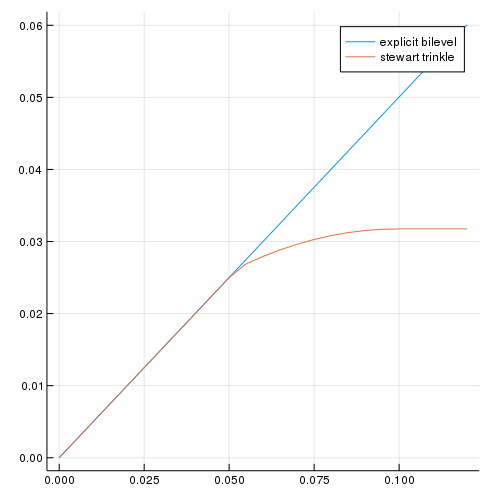

In [121]:
j = 5
plot(traj_exp_t,traj_exp[j,:],label="explicit bilevel")
plot!(traj_st_t,traj_st[j,:],label="stewart trinkle")

In [42]:
traj_exp

17×25 Array{Float64,2}:
 1.0     1.0          1.0          …   1.0           1.0        
 0.0     0.0          0.0              0.0           0.0        
 0.0     0.0          0.0              0.0           0.0        
 0.0     0.0          0.0              0.0           0.0        
 0.0     0.0025       0.005           -0.0600393    -0.0703142  
 0.0     0.0          0.0          …   0.0           0.0        
 0.015   0.0147572    0.0142745        0.0           0.0        
 0.0     0.0          0.0              0.0           0.0        
 0.0     0.0          0.0              0.0           0.0        
 0.0     0.0          0.0              0.0           0.0        
 0.5     0.5          0.5          …  -1.95687      -2.05497    
 0.0     0.0          0.0              0.0           0.0        
 0.0    -0.0485519   -0.096555        -2.48154e-23   2.48154e-23
 0.0     0.0          0.0              0.0           0.0        
 0.0     0.0          0.0              0.0           0.0        
 